# Semantic Segmentation with Cambridge Labeled Objects in Video dataset

## Import libraries

In [207]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import random
import re
from PIL import Image


import numpy as np
import matplotlib.pyplot as plt
from pylab import *
import os
import sys
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import *


#from tensorflow.keras.engine import Layer
from tensorflow.keras.applications.vgg16 import *
from tensorflow.keras.models import *
#from tensorflow.keras.applications.imagenet_utils import _obtain_input_shape
import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Convolution2D, ZeroPadding2D, MaxPooling2D, Cropping2D, Conv2D
from tensorflow.keras.layers import Input, Add, Dropout, Permute, add
# from tensorflow.compat.v1.layers import conv2d_transpose
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

import shutil
import zipfile
from tensorflow.keras.optimizers import Adam, SGD, Adagrad
from tensorflow.keras.losses import CategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.metrics import MeanIoU, Accuracy
import time

from tensorflow.keras.models import *
from tensorflow.keras.layers import *

# Environment checks

In [208]:
print(tf.__version__)

2.12.0


In [209]:
x = tf.random.uniform([3, 3])

print("Is there a GPU available: "),
print(tf.test.is_gpu_available())

print("Is the Tensor on GPU #0:  "),
print(x.device.endswith('GPU:0'))

print("Device name: {}".format((x.device)))

Is there a GPU available: 
False
Is the Tensor on GPU #0:  
False
Device name: /job:localhost/replica:0/task:0/device:CPU:0


In [210]:
print(tf.executing_eagerly())

True


In [211]:
zip_file = 'ASSN_3/c101.zip'
destination_folder = 'datasets/'

# Create the destination folder if it doesn't exist
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Extract the contents of the zip file to the destination folder
with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(destination_folder)

## Data preparation - Importing, Cleaning and Creating structured directory 

### Function to import and process frames and masks as tensors

In [212]:
def _read_to_tensor(fname, output_height=224, output_width=224, normalize_data=False):
    '''Function to read images from given image file path, and provide resized images as tensors
        Inputs: 
            fname - image file path
            output_height - required output image height
            output_width - required output image width
            normalize_data - if True, normalize data to be centered around 0 (mean 0, range 0 to 1)
        Output: Processed image tensors
    '''
    
    # Read the image as a tensor
    img_strings = tf.io.read_file(fname)
    imgs_decoded = tf.image.decode_jpeg(img_strings)
    
    # Resize the image
    output = tf.image.resize(imgs_decoded, [output_height, output_width])
    
    # Normalize if required
    if normalize_data:
        output = (output - 128) / 128
    return output

### Image directory and size parameters

In [213]:
img_dir = 'datasets/train/'

# Required image dimensions
output_height = 224
output_width = 224

### Reading frames and masks
- Mask file names end in "\_L.png"


In [214]:
def read_images(img_dir):
    '''Function to get all image directories, read images and masks in separate tensors
        Inputs: 
            img_dir - file directory
        Outputs 
            frame_tensors, masks_tensors, frame files list, mask files list
    '''
    
    # Get the file names list from provided directory
    file_list = [f for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]
    
    # Separate frame and mask files lists, exclude unnecessary files
    frames_list = [file for file in file_list if ('_L' not in file) and ('txt' not in file)]
    masks_list = [file for file in file_list if ('_L' in file) and ('txt' not in file)]
    
    frames_list.sort()
    masks_list.sort()
    
    print('{} frame files found in the provided directory.'.format(len(frames_list)))
    print('{} mask files found in the provided directory.'.format(len(masks_list)))
    
    # Create file paths from file names
    frames_paths = [os.path.join(img_dir, fname) for fname in frames_list]
    masks_paths = [os.path.join(img_dir, fname) for fname in masks_list]
    
    # Create dataset of tensors
    frame_data = tf.data.Dataset.from_tensor_slices(frames_paths)
    masks_data = tf.data.Dataset.from_tensor_slices(masks_paths)
    
    # Read images into the tensor dataset
    frame_tensors = frame_data.map(_read_to_tensor)
    masks_tensors = masks_data.map(_read_to_tensor)
    
    print('Completed importing {} frame images from the provided directory.'.format(len(frames_list)))
    print('Completed importing {} mask images from the provided directory.'.format(len(masks_list)))
    
    return frame_tensors, masks_tensors, frames_list, masks_list

frame_tensors, masks_tensors, frames_list, masks_list = read_images(img_dir)

90 frame files found in the provided directory.
90 mask files found in the provided directory.
Completed importing 90 frame images from the provided directory.
Completed importing 90 mask images from the provided directory.


### Displaying Images in the train dataset

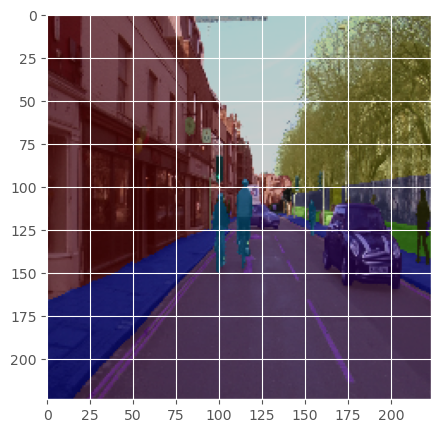

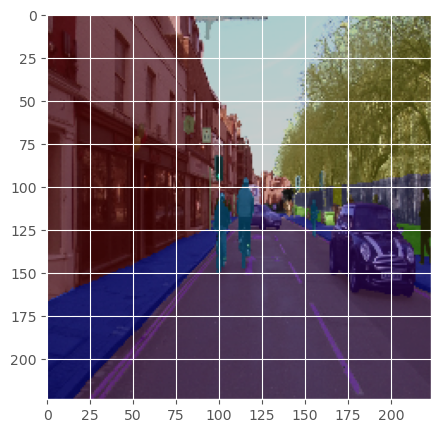

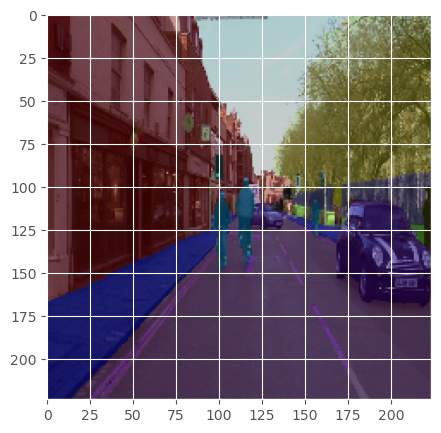

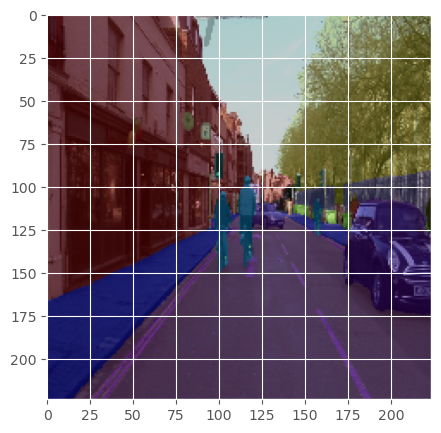

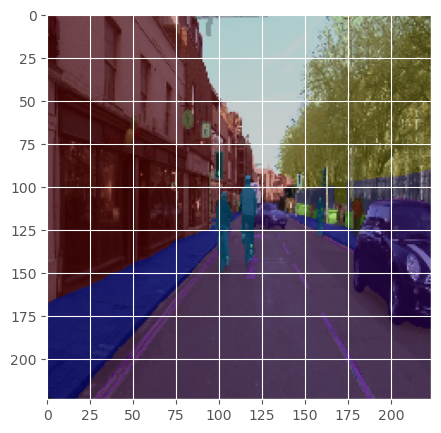

In [215]:
# Make an iterator to extract images from the tensor dataset

frame_batches = iter(frame_tensors)  # outside of TF Eager, we would use
mask_batches = iter(masks_tensors)

n_images_to_show = 5

for i in range(n_images_to_show):
    
    # Get the next image from iterator
    fig,ax = plt.subplots(1,figsize=(5,5))
    frame = frame_batches.next().numpy().astype(np.uint8)
    mask = mask_batches.next().numpy().astype(np.uint8)
    ax.imshow(frame)
    ax.imshow(mask,alpha = 0.4)

### Creating folder structure common for Computer Vision problems

In [216]:
DATA_PATH = 'datasets_train/'

# Create folders to hold images and masks

folders = ['train_frames/train', 'train_masks/train', 'val_frames/val', 'val_masks/val']


for folder in folders:
    try:
        os.makedirs(DATA_PATH + folder)
    except Exception as e: print(e)

[WinError 183] Cannot create a file when that file already exists: 'datasets_train/train_frames/train'
[WinError 183] Cannot create a file when that file already exists: 'datasets_train/train_masks/train'
[WinError 183] Cannot create a file when that file already exists: 'datasets_train/val_frames/val'
[WinError 183] Cannot create a file when that file already exists: 'datasets_train/val_masks/val'


### Saving frames and masks to correct directories

In [217]:
def generate_image_folder_structure(frames, masks, frames_list, masks_list):
    '''Function to save images in the appropriate folder directories 
        Inputs: 
            frames - frame tensor dataset
            masks - mask tensor dataset
            frames_list - frame file paths
            masks_list - mask file paths
    '''
    #Create iterators for frames and masks
    frame_batches = iter(frames)  # outside of TF Eager, we would use make_one_shot_iterator
    mask_batches = iter(masks)
    
    #Iterate over the train images while saving the frames and masks in appropriate folders
    dir_name='train'
    for file in zip(frames_list[:-round(0.1*len(frames_list))],masks_list[:-round(0.1*len(masks_list))]):
        
        
        #Convert tensors to numpy arrays
        frame = frame_batches.next().numpy().astype(np.uint8)
        mask = mask_batches.next().numpy().astype(np.uint8)
        
        #Convert numpy arrays to images
        frame = Image.fromarray(frame)
        mask = Image.fromarray(mask)
        
        #Save frames and masks to correct directories
        frame.save(DATA_PATH+'{}_frames/{}'.format(dir_name,dir_name)+'/'+file[0])
        mask.save(DATA_PATH+'{}_masks/{}'.format(dir_name,dir_name)+'/'+file[1])
    
    #Iterate over the val images while saving the frames and masks in appropriate folders
    dir_name='val'
    for file in zip(frames_list[-round(0.1*len(frames_list)):],masks_list[-round(0.1*len(masks_list)):]):
        
        
        #Convert tensors to numpy arrays
        frame = frame_batches.next().numpy().astype(np.uint8)
        mask = mask_batches.next().numpy().astype(np.uint8)
        
        #Convert numpy arrays to images
        frame = Image.fromarray(frame)
        mask = Image.fromarray(mask)
        
        #Save frames and masks to correct directories
        frame.save(DATA_PATH+'{}_frames/{}'.format(dir_name,dir_name)+'/'+file[0])
        mask.save(DATA_PATH+'{}_masks/{}'.format(dir_name,dir_name)+'/'+file[1])
    
    print("Saved {} frames to directory {}".format(len(frames_list),DATA_PATH))
    print("Saved {} masks to directory {}".format(len(masks_list),DATA_PATH))
    
generate_image_folder_structure(frame_tensors, masks_tensors, frames_list, masks_list)

#generate_image_folder_structure(train_frames, train_masks, val_files, 'val')

Saved 90 frames to directory datasets_train/
Saved 90 masks to directory datasets_train/


## Extract Target Class definitions

### Function to parse the file "label_colors.txt" which contains the class definitions

In [218]:
def parse_code(l):
    '''Function to parse lines in a text file, returns separated elements (label codes and names in this case)
    '''
    if len(l.strip().split("\t")) == 2:
        a, b = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), b
    else:
        a, b, c = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), c

### Parse and extract label names and codes

In [219]:
label_codes, label_names = zip(*[parse_code(l) for l in open("datasets/label_colors.txt")])
label_codes, label_names = list(label_codes), list(label_names)
label_codes[:5], label_names[:5]

([(64, 128, 64), (192, 0, 128), (0, 128, 192), (0, 128, 64), (128, 0, 0)],
 ['Animal', 'Archway', 'Bicyclist', 'Bridge', 'Building'])

### Create useful label and code conversion dictionaries
_These will be used for:_
- One hot encoding the mask labels for model training
- Decoding the predicted labels for interpretation and visualization

In [220]:
code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

In [221]:
name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

In [222]:
# id2code
list(id2code.items())[:5]

[(0, (64, 128, 64)),
 (1, (192, 0, 128)),
 (2, (0, 128, 192)),
 (3, (0, 128, 64)),
 (4, (128, 0, 0))]

In [223]:
# id2name
list(id2name.items())[:5]

[(0, 'Animal'),
 (1, 'Archway'),
 (2, 'Bicyclist'),
 (3, 'Bridge'),
 (4, 'Building')]

### Define functions for one hot encoding rgb labels, and decoding encoded predictions

In [224]:
def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image


def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

# Creating custom Image data generators

### Defining data generators

In [225]:
# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

### Custom image data generators for creating batches of frames and masks

In [226]:
def TrainAugmentGenerator(seed = 1, batch_size = 5):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    DATA_PATH + 'train_frames/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))

    train_mask_generator = train_masks_datagen.flow_from_directory(
    DATA_PATH + 'train_masks/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValAugmentGenerator(seed = 1, batch_size = 5):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    DATA_PATH + 'val_frames/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))


    val_mask_generator = val_masks_datagen.flow_from_directory(
    DATA_PATH + 'val_masks/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))


    while True:
        X1i = val_image_generator.next()
        X2i = val_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)
        


# Defining FCN-32 model for semantic segmentation
<b>FCN-32 Architecture</b>


In [227]:
os.getcwd()

'C:\\Users\\Admin\\OneDrive - The University of Liverpool\\Documents\\COMP534'

In [228]:
os.getcwd()
!mkdir pretrained_weights

A subdirectory or file pretrained_weights already exists.


### Function to create FCN-32 model, using VGG-16 pre-trained weights

In [229]:
VGG_Weights_path = "pretrained_weights/vgg16_weights_tf_dim_ordering_tf_kernels.h5"

IMAGE_ORDERING = 'channels_last'


def FCN32( n_classes ,  input_height=224, input_width=224 , vgg_level=3):

    assert input_height%32 == 0
    assert input_width%32 == 0

    
    img_input = Input(shape=(input_height,input_width,3))

    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', data_format=IMAGE_ORDERING )(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool', data_format=IMAGE_ORDERING )(x)
    f1 = x
    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool', data_format=IMAGE_ORDERING )(x)
    f2 = x

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool', data_format=IMAGE_ORDERING )(x)
    f3 = x

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool', data_format=IMAGE_ORDERING )(x)
    f4 = x

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool', data_format=IMAGE_ORDERING )(x)
    f5 = x

    x = Flatten(name='flatten')(x)
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dense(4096, activation='relu', name='fc2')(x)
    x = Dense( 1000 , activation='softmax', name='predictions')(x)

    vgg  = Model(  img_input , x  )
    vgg.load_weights(VGG_Weights_path)

    o = f5

    o = ( Conv2D( 4096 , ( 7 , 7 ) , activation='relu' , padding='same', data_format=IMAGE_ORDERING))(o)
    o = Dropout(0.5)(o)
    o = ( Conv2D( 4096 , ( 1 , 1 ) , activation='relu' , padding='same', data_format=IMAGE_ORDERING))(o)
    o = Dropout(0.5)(o)

    o = ( Conv2D( n_classes ,  ( 1 , 1 ) ,kernel_initializer='he_normal' , data_format=IMAGE_ORDERING))(o)
    o = Conv2DTranspose( n_classes , kernel_size=(32,32) ,  strides=(32,32) , use_bias=False ,  data_format=IMAGE_ORDERING )(o)
    #o_shape = Model(img_input , o ).output_shape

    #outputHeight = o_shape[2]
    #outputWidth = o_shape[3]

    #print ("koko" , o_shape)

    #o = (Reshape(( -1  , outputHeight*outputWidth   )))(o)
    #o = (Permute((2, 1)))(o)
    o = (Activation('softmax'))(o)
    model = Model( img_input , o )
    #model.outputWidth = outputWidth
    #model.outputHeight = outputHeight
    
    #only 10 last layer that trainable 
    for layer in model.layers[:len(model.layers)-10]:
        layer.trainable = False

    return model


In [230]:
model = FCN32( 32 ,  input_height=224, input_width=224 , vgg_level=3)


In [231]:
model.summary()

Model: "model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0  

## Compiling model

In [232]:
#model.load_weights("model_100_epochs.h5")

## Define model callback settings

In [233]:
# tb = TensorBoard(log_dir='logs', write_graph=True)
mc = ModelCheckpoint(mode='max', filepath='model_FCN32_checkpoint.h5', monitor='accuracy', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=50, verbose=1)
callbacks = [mc, es]
# callbacks = [tb, mc, es]

## Train and save the FCN model

In [234]:
def dice_coef(y_true, y_pred):
    """Computes the Dice coefficient between two tensors.
    
    Args:
    y_true: A tensor of ground truth values.
    y_pred: A tensor of predicted values.
    
    Returns:
    A tensor of the Dice coefficient.
    """
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return 1.-dice_coef(y_true, y_pred)

In [235]:
batch_size = 5
steps_per_epoch = np.ceil(float(len(frames_list) - round(0.2*len(frames_list))) / float(batch_size))
steps_per_epoch

15.0

In [236]:
validation_steps = (float((round(0.2*len(frames_list)))) / float(batch_size))
validation_steps 

3.6

In [237]:
num_epochs = 50

In [238]:
model.compile(optimizer='adam', loss="categorical_crossentropy", metrics=[MeanIoU(32),dice_coef,'accuracy'])

In [239]:
class TimingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.train_times = []
        
    def on_epoch_begin(self, epoch, logs={}):
        self.start_time = time.time()
        
    def on_epoch_end(self, epoch, logs={}):
        epoch_time = time.time() - self.start_time
        self.train_times.append(epoch_time)
        logs['time'] = epoch_time
        
# Create an instance of the TimingCallback class
timing_callback = TimingCallback()

# Train the model with the timing callback
result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
                      validation_data=ValAugmentGenerator(),
                      validation_steps=validation_steps, epochs=num_epochs,
                      callbacks=[callbacks, timing_callback], use_multiprocessing=False, verbose=1)
model.save_weights("model_FCN32.h5", overwrite=True)
# Get the training time for each epoch from the train_times attribute of the timing_callback object
training_time = np.sum(timing_callback.train_times)

# Print the total training time
print("Total training time: {} seconds".format(training_time))

Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Epoch 1/50
15/15 [==============================] - ETA: 0s - loss: 2.6042 - mean_io_u_16: 0.4848 - dice_coef: 0.2335 - accuracy: 0.2520Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.

Epoch 00001: accuracy improved from -inf to 0.25198, saving model to model_FCN32_checkpoint.h5
15/15 [==============================] - 69s 4s/step - loss: 2.6042 - mean_io_u_16: 0.4848 - dice_coef: 0.2335 - accuracy: 0.2520 - val_loss: 1.4366 - val_mean_io_u_16: 0.4848 - val_dice_coef: 0.5691 - val_accuracy: 0.4816 - time: 68.9483
Epoch 2/50
15/15 [==============================] - ETA: 0s - loss: 1.0706 - mean_io_u_16: 0.4848 - dice_coef: 0.6804 - accuracy: 0.6351
Epoch 00002: accuracy improved from 0.25198 to 0.63506, saving model to model_FCN32_checkpoint.h5
15/15 [==============================] - 62s 4s/step - loss: 1.0706 - mean_io_u_16: 0.4848 - dice_coef: 0.6804 - accuracy: 0.6351 - va

Epoch 19/50
15/15 [==============================] - ETA: 0s - loss: 2550.5283 - mean_io_u_16: 0.6317 - dice_coef: 0.6184 - accuracy: 0.5518
Epoch 00019: accuracy did not improve from 0.85044
15/15 [==============================] - 61s 4s/step - loss: 2550.5283 - mean_io_u_16: 0.6317 - dice_coef: 0.6184 - accuracy: 0.5518 - val_loss: 8372.9785 - val_mean_io_u_16: 0.6161 - val_dice_coef: 0.5862 - val_accuracy: 0.5291 - time: 61.2598
Epoch 20/50
15/15 [==============================] - ETA: 0s - loss: 32430.7402 - mean_io_u_16: 0.6448 - dice_coef: 0.5323 - accuracy: 0.4586
Epoch 00020: accuracy did not improve from 0.85044
15/15 [==============================] - 61s 4s/step - loss: 32430.7402 - mean_io_u_16: 0.6448 - dice_coef: 0.5323 - accuracy: 0.4586 - val_loss: 118488.5000 - val_mean_io_u_16: 0.6372 - val_dice_coef: 0.4836 - val_accuracy: 0.3928 - time: 60.8309
Epoch 21/50
15/15 [==============================] - ETA: 0s - loss: 158807.9219 - mean_io_u_16: 0.6209 - dice_coef: 0.445

15/15 [==============================] - ETA: 0s - loss: 8458326528.0000 - mean_io_u_16: 0.6360 - dice_coef: 0.4878 - accuracy: 0.4072
Epoch 00037: accuracy did not improve from 0.85044
15/15 [==============================] - 60s 4s/step - loss: 8458326528.0000 - mean_io_u_16: 0.6360 - dice_coef: 0.4878 - accuracy: 0.4072 - val_loss: 13926915072.0000 - val_mean_io_u_16: 0.6303 - val_dice_coef: 0.4754 - val_accuracy: 0.3814 - time: 60.4939
Epoch 38/50
15/15 [==============================] - ETA: 0s - loss: 12676390912.0000 - mean_io_u_16: 0.6285 - dice_coef: 0.4723 - accuracy: 0.3960
Epoch 00038: accuracy did not improve from 0.85044
15/15 [==============================] - 60s 4s/step - loss: 12676390912.0000 - mean_io_u_16: 0.6285 - dice_coef: 0.4723 - accuracy: 0.3960 - val_loss: 20107507712.0000 - val_mean_io_u_16: 0.6306 - val_dice_coef: 0.4776 - val_accuracy: 0.3791 - time: 60.2603
Epoch 39/50
15/15 [==============================] - ETA: 0s - loss: 17048162304.0000 - mean_io_u_

In [240]:
# result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch ,
#                 validation_data = ValAugmentGenerator(), 
#                 validation_steps = validation_steps, epochs=num_epochs, callbacks=callbacks,
# use_multiprocessing=False, verbose=1)
# model.save_weights("model_FCN32.h5", overwrite=True)

In [241]:
# best_model = None
# best_score = 0
# total_time=[]

# optimizers = ['adam', 'sgd', 'adagrad']

# for optimizer in optimizers:
#     model = FCN32(32 , input_height=224, input_width=224, vgg_level=3)
#     model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=[dice_coef, MeanIoU(32), 'accuracy'])
#     start_time = time.time()
#     print("start time:", start_time)
#     result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
#                        validation_data=ValAugmentGenerator(), 
#                        validation_steps=validation_steps, epochs=num_epochs,
#                        callbacks=callbacks, use_multiprocessing=False, verbose=1)
#     end_time = time.time()
#     print("end time:", end_time)
#     total = end_time - start_time
#     total_time.append(total)
#     print("val_accuracy:", result.history['val_accuracy'])
#     print("keys:", result.history.keys())
#     # Evaluate the model on the validation data
# #     _, accuracy = model.evaluate(ValAugmentGenerator(), verbose=0)
#     score = np.max(result.history['val_accuracy'])
#     print("score:", {score})
#     # Update the best model if necessary
#     if score > best_score:
#         best_model = model
#         best_score = score
#         best_hyperparameters = {
#             'optimizer': optimizer

#         }
# #         best_model.save_weights("best_model.h5", overwrite=True)
# print("total_time:", {np.sum(total_time)})
# print("Best hyperparameters:", best_hyperparameters)

# FCN32 Model Evaluation

### Model evaluation historical plots

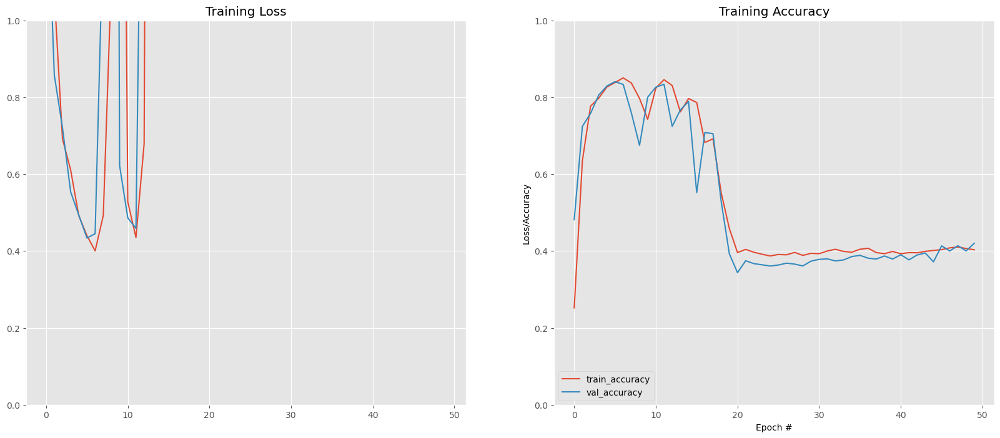

In [242]:
# Get actual number of epochs model was trained for
N = len(result.history['loss'])

#Plot the model evaluation history
plt.style.use("ggplot")
fig = plt.figure(figsize=(20,8))

fig.add_subplot(1,2,1)
plt.title("Training Loss")
plt.plot(np.arange(0, N), result.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), result.history["val_loss"], label="val_loss")
plt.ylim(0, 1)

fig.add_subplot(1,2,2)
plt.title("Training Accuracy")
plt.plot(np.arange(0, N), result.history["accuracy"], label="train_accuracy")
plt.plot(np.arange(0, N), result.history["val_accuracy"], label="val_accuracy")
plt.ylim(0, 1)

plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()

In [243]:
#training_gen = TrainAugmentGenerator()
testing_gen = ValAugmentGenerator() # Create the testing generator

### Extract and display model frame, prediction and mask batch

In [244]:

batch_img,batch_mask = next(testing_gen)
pred_all= model.predict(batch_img)
np.shape(pred_all)


Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.
1/1 [==============================] - 1s 1s/step


(5, 224, 224, 32)

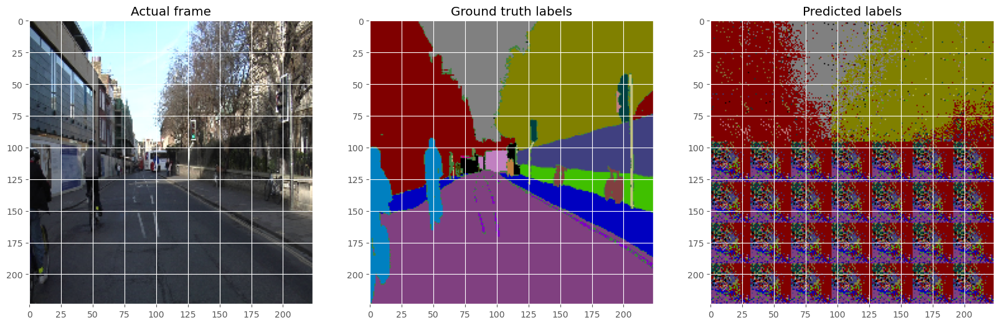

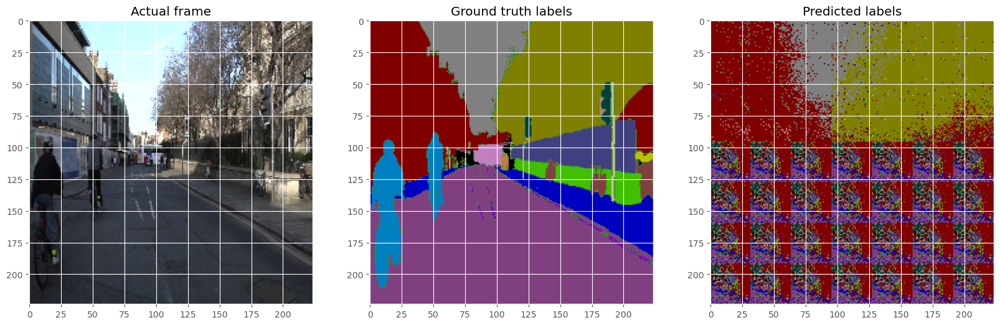

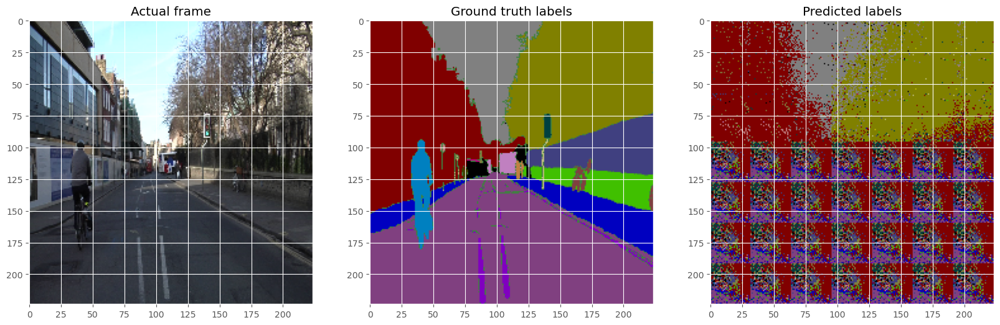

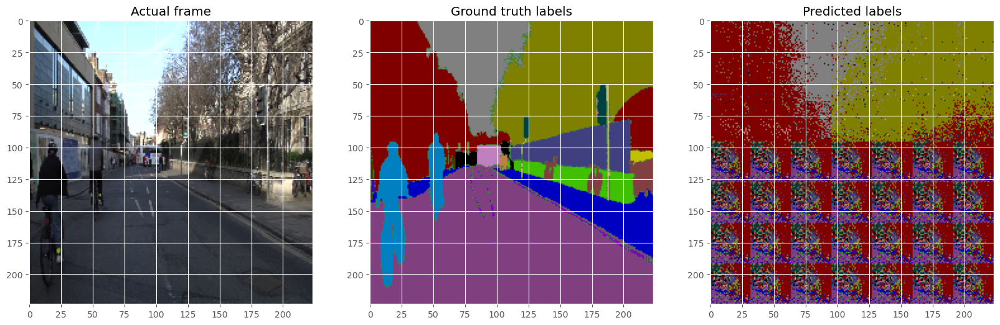

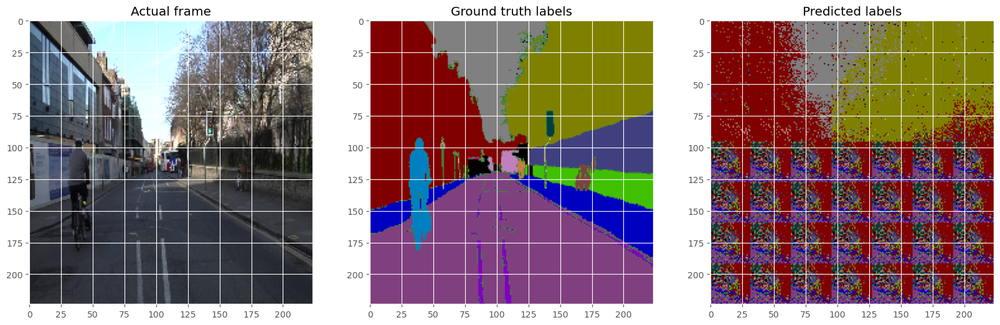

In [245]:
for i in range(0,np.shape(pred_all)[0]):
    
    fig = plt.figure(figsize=(20,8))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[i])
    ax1.title.set_text('Actual frame')
#     ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(onehot_to_rgb(batch_mask[i],id2code))
#     ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(pred_all[i],id2code))
#     ax3.grid(b=None)
    
    plt.show()

In [246]:
# # Evaluate the model on the testing data
# test_loss, test_accuracy = model.evaluate(testing_gen)

# # Print the results
# print("Test Loss:", test_loss)
# print("Test Accuracy:", test_accuracy)


# Defining DeepLab_v3 model for semantic segmentation
</b>DeepLab_v3 Architecture</b>

In [247]:
# Create generators
train_generator = TrainAugmentGenerator(batch_size=batch_size)
val_generator = ValAugmentGenerator(batch_size=batch_size)

# Generate a batch of data
train_images, train_masks = next(train_generator)
val_images, val_masks = next(val_generator)

# Print shapes
print(train_images.shape)  # should be (5, 224, 224, 3)
print(train_masks.shape)   # should be (5, 224, 224, num_classes)
print(val_images.shape)    # should be (5, 224, 224, 3)
print(val_masks.shape)

Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.
(5, 224, 224, 3)
(5, 224, 224, 32)
(5, 224, 224, 3)
(5, 224, 224, 32)


In [248]:
def initial_block(inp):
    inp1 = inp
    conv = Conv2D(filters=13, kernel_size=3, strides=2,
                  padding='same', kernel_initializer='he_normal')(inp)
    pool = MaxPool2D(2)(inp1)
    concat = concatenate([conv, pool])
    return concat


def encoder_bottleneck(inp, filters, name, dilation_rate=2, downsample=False, dilated=False, asymmetric=False, drop_rate=0.1):
    reduce = filters // 4
    down = inp
    kernel_stride = 1

    # Downsample
    if downsample:
        kernel_stride = 2
        pad_activations = filters - inp.shape.as_list()[-1]
        down = MaxPool2D(2)(down)
        down = Permute(dims=(1, 3, 2))(down)
        down = ZeroPadding2D(padding=((0, 0), (0, pad_activations)))(down)
        down = Permute(dims=(1, 3, 2))(down)

    # 1*1 Reduce
    x = Conv2D(filters=reduce, kernel_size=kernel_stride, strides=kernel_stride, padding='same',
               use_bias=False, kernel_initializer='he_normal', name=f'{name}_reduce')(inp)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # Conv
    if not dilated and not asymmetric:
        x = Conv2D(filters=reduce, kernel_size=3, padding='same',
                   kernel_initializer='he_normal', name=f'{name}_conv_reg')(x)
    elif dilated:
        x = Conv2D(filters=reduce, kernel_size=3, padding='same', dilation_rate=dilation_rate,
                   kernel_initializer='he_normal', name=f'{name}_reduce_dilated')(x)
    elif asymmetric:
        x = Conv2D(filters=reduce, kernel_size=(1, 5), padding='same', use_bias=False,
                   kernel_initializer='he_normal', name=f'{name}_asymmetric')(x)
        x = Conv2D(filters=reduce, kernel_size=(5, 1), padding='same',
                   kernel_initializer='he_normal', name=name)(x)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # 1*1 Expand
    x = Conv2D(filters=filters, kernel_size=1, padding='same', use_bias=False,
               kernel_initializer='he_normal', name=f'{name}_expand')(x)
    x = BatchNormalization(momentum=0.1)(x)
    x = SpatialDropout2D(rate=drop_rate)(x)

    concat = Add()([x, down])
    concat = PReLU(shared_axes=[1, 2])(concat)
    return concat


def decoder_bottleneck(inp, filters, name, upsample=False):
    reduce = filters // 4
    up = inp

    # Upsample
    if upsample:
        up = Conv2D(filters=filters, kernel_size=1, strides=1, padding='same',
                    use_bias=False, kernel_initializer='he_normal', name=f'{name}_upsample')(up)
        up = UpSampling2D(size=2)(up)

    # 1*1 Reduce
    x = Conv2D(filters=reduce, kernel_size=1, strides=1, padding='same',
               use_bias=False, kernel_initializer='he_normal', name=f'{name}_reduce')(inp)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # Conv
    if not upsample:
        x = Conv2D(filters=reduce, kernel_size=3, strides=1, padding='same',
                   kernel_initializer='he_normal', name=f'{name}_conv_reg')(x)
    else:
        x = Conv2DTranspose(filters=reduce, kernel_size=3, strides=2, padding='same',
                            kernel_initializer='he_normal', name=f'{name}_transpose')(x)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # 1*1 Expand
    x = Conv2D(filters=filters, kernel_size=1, strides=1, padding='same',
               use_bias=False, kernel_initializer='he_normal', name=f'{name}_expand')(x)
    x = BatchNormalization(momentum=0.1)(x)

    concat = Add()([x, up])
    concat = ReLU()(concat)

    return concat

In [249]:
def ENet(H=224, W=224, nclasses=32): # H=384, W=384
    '''
    '''

    print('Loading ENet')
    inp = Input(shape=(H, W, 3))
    enc = initial_block(inp)

    # Bottleneck 1.0
    enc = encoder_bottleneck(enc, 64, name='enc1',
                             downsample=True, drop_rate=0.001)

    enc = encoder_bottleneck(enc, 64, name='enc1.1', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.2', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.3', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.4', drop_rate=0.001)
    
    enc = encoder_bottleneck(enc, 64, name='enc1.5', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.6', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.7', drop_rate=0.001)

    # Bottleneck 2.0
    enc = encoder_bottleneck(enc, 128, name='enc2.0', downsample=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.1')
    enc = encoder_bottleneck(enc, 128, name='enc2.2',
                             dilation_rate=2, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.3', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.4',
                             dilation_rate=4, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.5', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.6',
                             dilation_rate=6, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.7', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.8',
                             dilation_rate=8, dilated=True)
    
    enc = encoder_bottleneck(enc, 128, name='enc2.9')
    enc = encoder_bottleneck(enc, 128, name='enc2.10',
                             dilation_rate=10, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.11', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.12',
                             dilation_rate=12, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.13', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.14',
                             dilation_rate=14, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.15', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.16',
                             dilation_rate=16, dilated=True)

    # Bottleneck 3.0
    enc = encoder_bottleneck(enc, 128, name='enc3.0')
    enc = encoder_bottleneck(enc, 128, name='enc3.1',
                             dilation_rate=2, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.2', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.3',
                             dilation_rate=4, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.4')
    enc = encoder_bottleneck(enc, 128, name='enc3.5',
                             dilation_rate=6, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.6')
    enc = encoder_bottleneck(enc, 128, name='enc3.7',
                             dilation_rate=8, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.8', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.9',
                             dilation_rate=10, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.10', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.11',
                             dilation_rate=12, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.12', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.13',
                             dilation_rate=14, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.14', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.15',
                             dilation_rate=16, dilated=True)




    # Bottleneck 4.0
    dec = decoder_bottleneck(enc, 64, name='dec4.0', upsample=True)
    dec = decoder_bottleneck(dec, 64, name='dec4.1')
    dec = decoder_bottleneck(dec, 64, name='dec4.2')
    dec = decoder_bottleneck(dec, 64, name='dec4.3')
    dec = decoder_bottleneck(dec, 64, name='dec4.4')

    # Bottleneck 5.0
    dec = decoder_bottleneck(dec, 16, name='dec5.0', upsample=True)
    dec = decoder_bottleneck(dec, 16, name='dec5.1')
    dec = decoder_bottleneck(dec, 16, name='dec5.2')
    dec = decoder_bottleneck(dec, 16, name='dec5.3')

    dec = Conv2DTranspose(filters=nclasses, kernel_size=2, strides=2,
                          padding='same', kernel_initializer='he_normal', name='fullconv')(dec)
    dec = Activation('softmax')(dec)

    model = Model(inputs=inp, outputs=dec, name='Enet')
    
    return model

## Train and save the Deeplab_v3 model

In [250]:
model = ENet()

Loading ENet


In [251]:
model.summary()

Model: "Enet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_57 (Conv2D)             (None, 112, 112, 13  364         ['input_18[0][0]']               
                                )                                                                 
                                                                                                  
 max_pooling2d_19 (MaxPooling2D  (None, 112, 112, 3)  0          ['input_18[0][0]']               
 )                                                                                             

                                                                                                  
 p_re_lu_711 (PReLU)            (None, 56, 56, 16)   16          ['batch_normalization_774[0][0]']
                                                                                                  
 enc1.2_conv_reg (Conv2D)       (None, 56, 56, 16)   2320        ['p_re_lu_711[0][0]']            
                                                                                                  
 batch_normalization_775 (Batch  (None, 56, 56, 16)  64          ['enc1.2_conv_reg[0][0]']        
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_712 (PReLU)            (None, 56, 56, 16)   16          ['batch_normalization_775[0][0]']
                                                                                                  
 enc1.2_ex

                                                                                                  
 enc1.5_conv_reg (Conv2D)       (None, 56, 56, 16)   2320        ['p_re_lu_720[0][0]']            
                                                                                                  
 batch_normalization_784 (Batch  (None, 56, 56, 16)  64          ['enc1.5_conv_reg[0][0]']        
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_721 (PReLU)            (None, 56, 56, 16)   16          ['batch_normalization_784[0][0]']
                                                                                                  
 enc1.5_expand (Conv2D)         (None, 56, 56, 64)   1024        ['p_re_lu_721[0][0]']            
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_793 (Batch  (None, 28, 28, 32)  128         ['enc2.0_conv_reg[0][0]']        
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_730 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_793[0][0]']
                                                                                                  
 max_pooling2d_21 (MaxPooling2D  (None, 28, 28, 64)  0           ['p_re_lu_728[0][0]']            
 )                                                                                                
                                                                                                  
 enc2.0_expand (Conv2D)         (None, 28, 28, 128)  4096        ['p_re_lu_730[0][0]']            
          

 enc2.3_reduce (Conv2D)         (None, 28, 28, 32)   4096        ['p_re_lu_737[0][0]']            
                                                                                                  
 batch_normalization_801 (Batch  (None, 28, 28, 32)  128         ['enc2.3_reduce[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_738 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_801[0][0]']
                                                                                                  
 enc2.3_asymmetric (Conv2D)     (None, 28, 28, 32)   5120        ['p_re_lu_738[0][0]']            
                                                                                                  
 enc2.3 (Conv2D)                (None, 28, 28, 32)   5152        ['enc2.3_asymmetric[0][0]']      
          

 p_re_lu_746 (PReLU)            (None, 28, 28, 128)  128         ['add_263[0][0]']                
                                                                                                  
 enc2.6_reduce (Conv2D)         (None, 28, 28, 32)   4096        ['p_re_lu_746[0][0]']            
                                                                                                  
 batch_normalization_810 (Batch  (None, 28, 28, 32)  128         ['enc2.6_reduce[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_747 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_810[0][0]']
                                                                                                  
 enc2.6_reduce_dilated (Conv2D)  (None, 28, 28, 32)  9248        ['p_re_lu_747[0][0]']            
          

 p_re_lu_755 (PReLU)            (None, 28, 28, 128)  128         ['add_266[0][0]']                
                                                                                                  
 enc2.9_reduce (Conv2D)         (None, 28, 28, 32)   4096        ['p_re_lu_755[0][0]']            
                                                                                                  
 batch_normalization_819 (Batch  (None, 28, 28, 32)  128         ['enc2.9_reduce[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_756 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_819[0][0]']
                                                                                                  
 enc2.9_conv_reg (Conv2D)       (None, 28, 28, 32)   9248        ['p_re_lu_756[0][0]']            
          

                                                                                                  
 p_re_lu_764 (PReLU)            (None, 28, 28, 128)  128         ['add_269[0][0]']                
                                                                                                  
 enc2.12_reduce (Conv2D)        (None, 28, 28, 32)   4096        ['p_re_lu_764[0][0]']            
                                                                                                  
 batch_normalization_828 (Batch  (None, 28, 28, 32)  128         ['enc2.12_reduce[0][0]']         
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_765 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_828[0][0]']
                                                                                                  
 enc2.12_r

 add_272 (Add)                  (None, 28, 28, 128)  0           ['spatial_dropout2d_227[0][0]',  
                                                                  'p_re_lu_770[0][0]']            
                                                                                                  
 p_re_lu_773 (PReLU)            (None, 28, 28, 128)  128         ['add_272[0][0]']                
                                                                                                  
 enc2.15_reduce (Conv2D)        (None, 28, 28, 32)   4096        ['p_re_lu_773[0][0]']            
                                                                                                  
 batch_normalization_837 (Batch  (None, 28, 28, 32)  128         ['enc2.15_reduce[0][0]']         
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_7

                                                                                                  
 add_275 (Add)                  (None, 28, 28, 128)  0           ['spatial_dropout2d_230[0][0]',  
                                                                  'p_re_lu_779[0][0]']            
                                                                                                  
 p_re_lu_782 (PReLU)            (None, 28, 28, 128)  128         ['add_275[0][0]']                
                                                                                                  
 enc3.1_reduce (Conv2D)         (None, 28, 28, 32)   4096        ['p_re_lu_782[0][0]']            
                                                                                                  
 batch_normalization_846 (Batch  (None, 28, 28, 32)  128         ['enc3.1_reduce[0][0]']          
 Normalization)                                                                                   
          

                                                                                                  
 add_278 (Add)                  (None, 28, 28, 128)  0           ['spatial_dropout2d_233[0][0]',  
                                                                  'p_re_lu_788[0][0]']            
                                                                                                  
 p_re_lu_791 (PReLU)            (None, 28, 28, 128)  128         ['add_278[0][0]']                
                                                                                                  
 enc3.4_reduce (Conv2D)         (None, 28, 28, 32)   4096        ['p_re_lu_791[0][0]']            
                                                                                                  
 batch_normalization_855 (Batch  (None, 28, 28, 32)  128         ['enc3.4_reduce[0][0]']          
 Normalization)                                                                                   
          

                                                                  'p_re_lu_797[0][0]']            
                                                                                                  
 p_re_lu_800 (PReLU)            (None, 28, 28, 128)  128         ['add_281[0][0]']                
                                                                                                  
 enc3.7_reduce (Conv2D)         (None, 28, 28, 32)   4096        ['p_re_lu_800[0][0]']            
                                                                                                  
 batch_normalization_864 (Batch  (None, 28, 28, 32)  128         ['enc3.7_reduce[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_801 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_864[0][0]']
          

                                                                  'p_re_lu_806[0][0]']            
                                                                                                  
 p_re_lu_809 (PReLU)            (None, 28, 28, 128)  128         ['add_284[0][0]']                
                                                                                                  
 enc3.10_reduce (Conv2D)        (None, 28, 28, 32)   4096        ['p_re_lu_809[0][0]']            
                                                                                                  
 batch_normalization_873 (Batch  (None, 28, 28, 32)  128         ['enc3.10_reduce[0][0]']         
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_810 (PReLU)            (None, 28, 28, 32)   32          ['batch_normalization_873[0][0]']
          

 Dropout2D)                                                                                       
                                                                                                  
 add_287 (Add)                  (None, 28, 28, 128)  0           ['spatial_dropout2d_242[0][0]',  
                                                                  'p_re_lu_815[0][0]']            
                                                                                                  
 p_re_lu_818 (PReLU)            (None, 28, 28, 128)  128         ['add_287[0][0]']                
                                                                                                  
 enc3.13_reduce (Conv2D)        (None, 28, 28, 32)   4096        ['p_re_lu_818[0][0]']            
                                                                                                  
 batch_normalization_882 (Batch  (None, 28, 28, 32)  128         ['enc3.13_reduce[0][0]']         
 Normaliza

                                                                                                  
 spatial_dropout2d_245 (Spatial  (None, 28, 28, 128)  0          ['batch_normalization_890[0][0]']
 Dropout2D)                                                                                       
                                                                                                  
 add_290 (Add)                  (None, 28, 28, 128)  0           ['spatial_dropout2d_245[0][0]',  
                                                                  'p_re_lu_824[0][0]']            
                                                                                                  
 p_re_lu_827 (PReLU)            (None, 28, 28, 128)  128         ['add_290[0][0]']                
                                                                                                  
 dec4.0_reduce (Conv2D)         (None, 28, 28, 16)   2048        ['p_re_lu_827[0][0]']            
          

                                                                  're_lu_46[0][0]']               
                                                                                                  
 re_lu_47 (ReLU)                (None, 56, 56, 64)   0           ['add_293[0][0]']                
                                                                                                  
 dec4.3_reduce (Conv2D)         (None, 56, 56, 16)   1024        ['re_lu_47[0][0]']               
                                                                                                  
 batch_normalization_900 (Batch  (None, 56, 56, 16)  64          ['dec4.3_reduce[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_834 (PReLU)            (None, 56, 56, 16)   16          ['batch_normalization_900[0][0]']
          

                                                                                                  
 dec5.1_reduce (Conv2D)         (None, 112, 112, 4)  64          ['re_lu_50[0][0]']               
                                                                                                  
 batch_normalization_909 (Batch  (None, 112, 112, 4)  16         ['dec5.1_reduce[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 p_re_lu_840 (PReLU)            (None, 112, 112, 4)  4           ['batch_normalization_909[0][0]']
                                                                                                  
 dec5.1_conv_reg (Conv2D)       (None, 112, 112, 4)  148         ['p_re_lu_840[0][0]']            
                                                                                                  
 batch_nor

                                )                                                                 
                                                                                                  
Total params: 699,660
Trainable params: 684,300
Non-trainable params: 15,360
__________________________________________________________________________________________________


In [252]:
model.compile(optimizer='adam', loss="categorical_crossentropy", metrics=[dice_coef, MeanIoU(32), 'accuracy'])

In [253]:
mc = ModelCheckpoint(mode='max', filepath='model_ENet_checkpoint.h5', monitor='accuracy', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=50, verbose=1)
callbacks = [mc, es]

In [254]:
class TimingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.train_times = []
        
    def on_epoch_begin(self, epoch, logs={}):
        self.start_time = time.time()
        
    def on_epoch_end(self, epoch, logs={}):
        epoch_time = time.time() - self.start_time
        self.train_times.append(epoch_time)
        logs['time'] = epoch_time
        
# Create an instance of the TimingCallback class
timing_callback = TimingCallback()

# Train the model with the timing callback
dl_result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
                      validation_data=ValAugmentGenerator(),
                      validation_steps=validation_steps, epochs=num_epochs,
                      callbacks=[callbacks, timing_callback], use_multiprocessing=False, verbose=1)
model.save_weights("model_ENet.h5", overwrite=True)
# Get the training time for each epoch from the train_times attribute of the timing_callback object
training_time = np.sum(timing_callback.train_times)

# Print the total training time
print("Total training time: {} seconds".format(training_time))


Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Epoch 1/50
15/15 [==============================] - ETA: 0s - loss: 3.9879 - dice_coef: 0.0749 - mean_io_u_17: 0.4848 - accuracy: 0.0568Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.

Epoch 00001: accuracy improved from -inf to 0.05681, saving model to model_ENet_checkpoint.h5
15/15 [==============================] - 100s 3s/step - loss: 3.9879 - dice_coef: 0.0749 - mean_io_u_17: 0.4848 - accuracy: 0.0568 - val_loss: 3.1885 - val_dice_coef: 0.1109 - val_mean_io_u_17: 0.4848 - val_accuracy: 0.1208 - time: 99.8076
Epoch 2/50
15/15 [==============================] - ETA: 0s - loss: 2.9200 - dice_coef: 0.1445 - mean_io_u_17: 0.4848 - accuracy: 0.1764
Epoch 00002: accuracy improved from 0.05681 to 0.17642, saving model to model_ENet_checkpoint.h5
15/15 [==============================] - 45s 3s/step - loss: 2.9200 - dice_coef: 0.1445 - mean_io_u_17: 0.4848 - accuracy: 0.1764 - val

Epoch 18/50
15/15 [==============================] - ETA: 0s - loss: 0.3710 - dice_coef: 0.9084 - mean_io_u_17: 0.4848 - accuracy: 0.8702
Epoch 00018: accuracy improved from 0.86511 to 0.87015, saving model to model_ENet_checkpoint.h5
15/15 [==============================] - 47s 3s/step - loss: 0.3710 - dice_coef: 0.9084 - mean_io_u_17: 0.4848 - accuracy: 0.8702 - val_loss: 0.3885 - val_dice_coef: 0.9039 - val_mean_io_u_17: 0.4848 - val_accuracy: 0.8693 - time: 46.8280
Epoch 19/50
15/15 [==============================] - ETA: 0s - loss: 0.3613 - dice_coef: 0.9100 - mean_io_u_17: 0.4848 - accuracy: 0.8724
Epoch 00019: accuracy improved from 0.87015 to 0.87239, saving model to model_ENet_checkpoint.h5
15/15 [==============================] - 45s 3s/step - loss: 0.3613 - dice_coef: 0.9100 - mean_io_u_17: 0.4848 - accuracy: 0.8724 - val_loss: 0.3531 - val_dice_coef: 0.9125 - val_mean_io_u_17: 0.4848 - val_accuracy: 0.8787 - time: 44.8276
Epoch 20/50
15/15 [==============================] -

Epoch 36/50
15/15 [==============================] - ETA: 0s - loss: 0.2392 - dice_coef: 0.9314 - mean_io_u_17: 0.4848 - accuracy: 0.8956
Epoch 00036: accuracy improved from 0.89506 to 0.89563, saving model to model_ENet_checkpoint.h5
15/15 [==============================] - 45s 3s/step - loss: 0.2392 - dice_coef: 0.9314 - mean_io_u_17: 0.4848 - accuracy: 0.8956 - val_loss: 0.2522 - val_dice_coef: 0.9303 - val_mean_io_u_17: 0.4848 - val_accuracy: 0.8976 - time: 45.0909
Epoch 37/50
15/15 [==============================] - ETA: 0s - loss: 0.2554 - dice_coef: 0.9280 - mean_io_u_17: 0.4848 - accuracy: 0.8912
Epoch 00037: accuracy did not improve from 0.89563
15/15 [==============================] - 44s 3s/step - loss: 0.2554 - dice_coef: 0.9280 - mean_io_u_17: 0.4848 - accuracy: 0.8912 - val_loss: 0.2820 - val_dice_coef: 0.9250 - val_mean_io_u_17: 0.4848 - val_accuracy: 0.8909 - time: 44.4396
Epoch 38/50
15/15 [==============================] - ETA: 0s - loss: 0.2965 - dice_coef: 0.9174 - 

In [255]:
# dl_result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch ,
#                 validation_data = ValAugmentGenerator(), 
#                 validation_steps = validation_steps, epochs=num_epochs, callbacks=callbacks,
# use_multiprocessing=False, verbose=1)
# model.save_weights("model_ENet.h5", overwrite=True)

In [256]:
# best_model = None
# best_score = 0
# total_time=[]

# optimizers = ['adam', 'sgd', 'adagrad']

# for optimizer in optimizers:
#     model = ENet()
#     model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=[dice_coef, MeanIoU(32), 'accuracy'])
#     start_time = time.time()
#     print("start time:", start_time)
#     result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
#                        validation_data=ValAugmentGenerator(), 
#                        validation_steps=validation_steps, epochs=num_epochs,
#                        callbacks=callbacks, use_multiprocessing=False, verbose=1)
#     end_time = time.time()
#     print("end time:", end_time)
#     total = end_time - start_time
#     total_time.append(total)
#     print("val_accuracy:", result.history['val_accuracy'])
#     print("keys:", result.history.keys())
#     # Evaluate the model on the validation data
# #     _, accuracy = model.evaluate(ValAugmentGenerator(), verbose=0)
#     score = np.max(result.history['val_accuracy'])
#     print("score:", {score})
#     # Update the best model if necessary
#     if score > best_score:
#         best_model = model
#         best_score = score
#         best_hyperparameters = {
#             'optimizer': optimizer

#         }
# #         best_model.save_weights("best_model.h5", overwrite=True)
# print("total_time:", {np.sum(total_time)})
# print("Best hyperparameters:", best_hyperparameters)

# DeepLab_v3 Model Evaluation

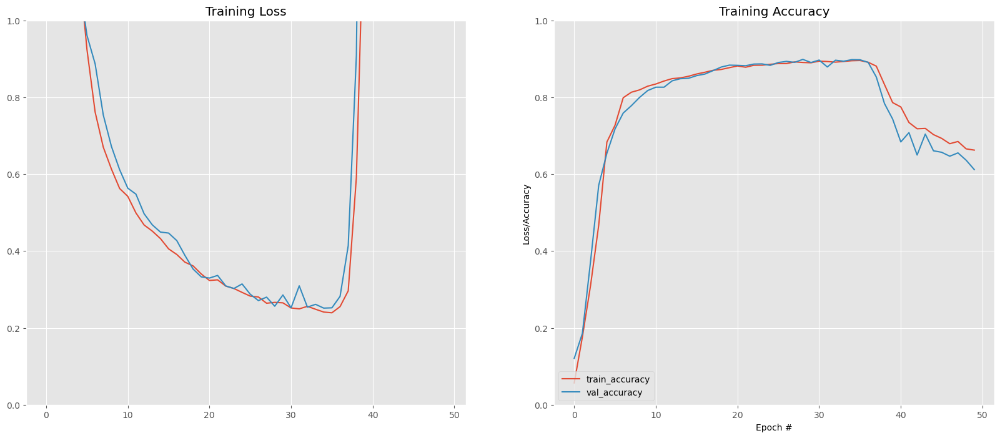

In [257]:
# Get actual number of epochs model was trained for
N = len(dl_result.history['loss'])

#Plot the model evaluation history
plt.style.use("ggplot")
fig = plt.figure(figsize=(20,8))

fig.add_subplot(1,2,1)
plt.title("Training Loss")
plt.plot(np.arange(0, N), dl_result.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), dl_result.history["val_loss"], label="val_loss")
plt.ylim(0, 1)

fig.add_subplot(1,2,2)
plt.title("Training Accuracy")
plt.plot(np.arange(0, N), dl_result.history["accuracy"], label="train_accuracy")
plt.plot(np.arange(0, N), dl_result.history["val_accuracy"], label="val_accuracy")
plt.ylim(0, 1)

plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()

### Extract and display model frame, prediction and mask batch

In [258]:
testing_gen = ValAugmentGenerator()

batch_img,batch_mask = next(testing_gen)
pred_all= model.predict(batch_img)
np.shape(pred_all)

Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.
1/1 [==============================] - 3s 3s/step


(5, 224, 224, 32)

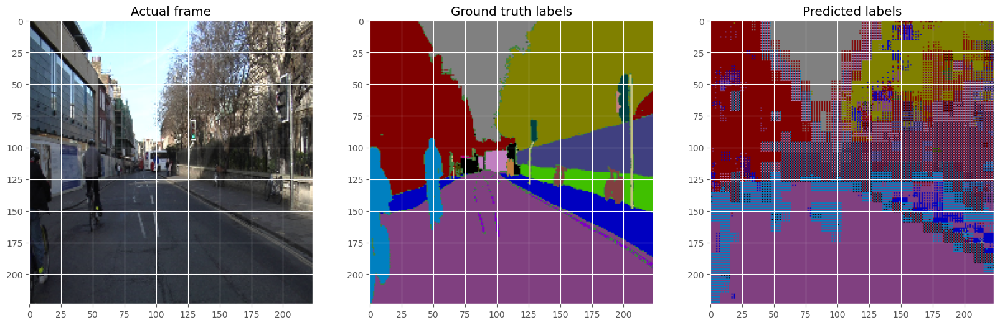

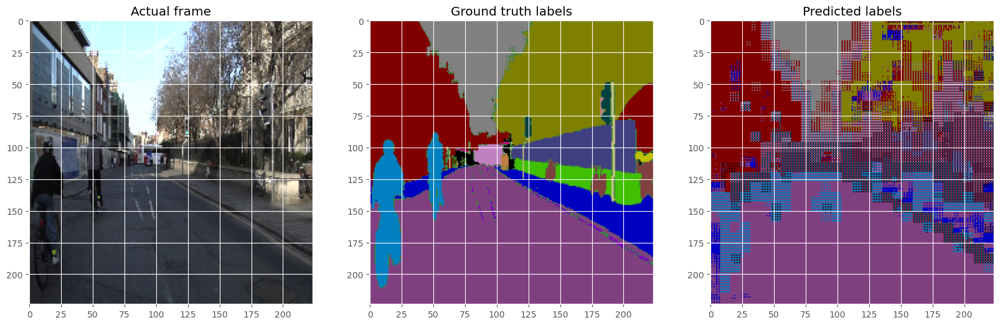

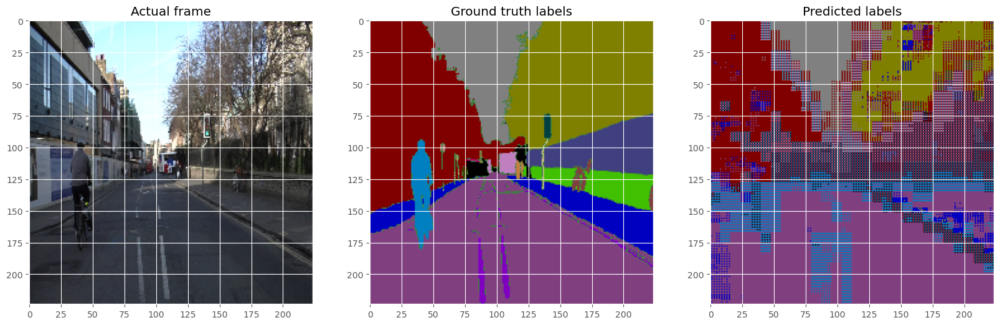

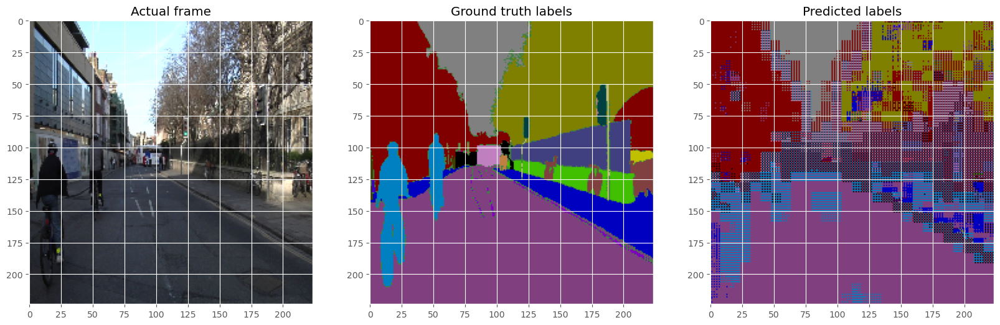

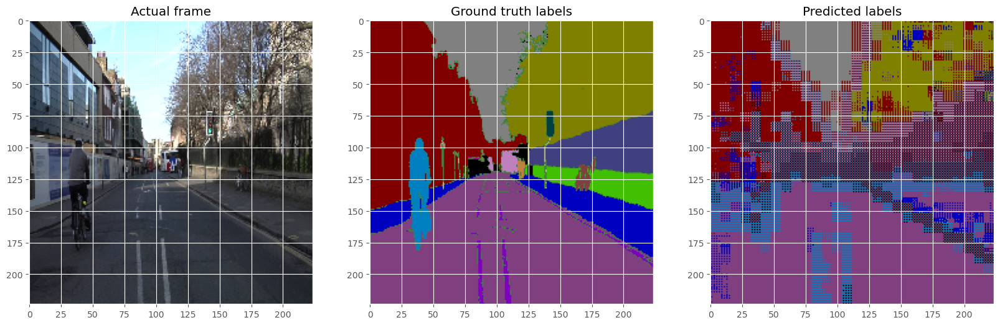

In [259]:
for i in range(0,np.shape(pred_all)[0]):
    
    fig = plt.figure(figsize=(20,8))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[i])
    ax1.title.set_text('Actual frame')
#     ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(onehot_to_rgb(batch_mask[i],id2code))
#     ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(pred_all[i],id2code))
#     ax3.grid(b=None)
    
    plt.show()

In [261]:
# # Evaluate the model on the testing data
# test_loss, test_accuracy = model.evaluate(testing_gen)

# # Print the results
# print("Deeplab Test Loss:", test_loss)
# print("Deep Lab Test Accuracy:", test_accuracy)

# Defining UNet model for semantic segmentation

In [195]:
def unet(n_filters = 16, bn = True, dilation_rate = 1):
    '''Validation Image data generator
        Inputs: 
            n_filters - base convolution filters
            bn - flag to set batch normalization
            dilation_rate - convolution dilation rate
        Output: Unet keras Model
    '''
    #Define input batch shape
    batch_shape=(224,224,3)
    inputs = Input(batch_shape=(5, 224, 224, 3))
    print(inputs)
    
    conv1 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(inputs)
    if bn:
        conv1 = BatchNormalization()(conv1)
        
    conv1 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv1)
    if bn:
        conv1 = BatchNormalization()(conv1)
    
    pool1 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv1)

    conv2 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool1)
    if bn:
        conv2 = BatchNormalization()(conv2)
        
    conv2 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv2)
    if bn:
        conv2 = BatchNormalization()(conv2)
    
    pool2 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv2)

    conv3 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool2)
    if bn:
        conv3 = BatchNormalization()(conv3)
        
    conv3 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv3)
    if bn:
        conv3 = BatchNormalization()(conv3)
        
    pool3 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv3)

    conv4 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool3)
    if bn:
        conv4 = BatchNormalization()(conv4)
        
    conv4 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv4)
    if bn:
        conv4 = BatchNormalization()(conv4)
        
    pool4 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv4)

    conv5 = Conv2D(n_filters * 16, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool4)
    if bn:
        conv5 = BatchNormalization()(conv5)
        
    conv5 = Conv2D(n_filters * 16, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv5)
    if bn:
        conv5 = BatchNormalization()(conv5)
        
    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    
    conv6 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up6)
    if bn:
        conv6 = BatchNormalization()(conv6)
        
    conv6 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv6)
    if bn:
        conv6 = BatchNormalization()(conv6)
        
    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    
    conv7 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up7)
    if bn:
        conv7 = BatchNormalization()(conv7)
        
    conv7 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv7)
    if bn:
        conv7 = BatchNormalization()(conv7)
        
    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    
    conv8 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up8)
    if bn:
        conv8 = BatchNormalization()(conv8)
        
    conv8 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv8)
    if bn:
        conv8 = BatchNormalization()(conv8)
        
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    
    conv9 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up9)
    if bn:
        conv9 = BatchNormalization()(conv9)
        
    conv9 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv9)
    if bn:
        conv9 = BatchNormalization()(conv9)
        
    conv10 = Conv2D(32, (1, 1), activation='softmax', padding = 'same', dilation_rate = dilation_rate)(conv9)

    model = Model(inputs=inputs, outputs=conv10)

    
    return model

In [196]:
model = unet(n_filters = 32)

KerasTensor(type_spec=TensorSpec(shape=(5, 224, 224, 3), dtype=tf.float32, name='input_16'), name='input_16', description="created by layer 'input_16'")


In [197]:
model.summary()

Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(5, 224, 224, 3)]   0           []                               
                                                                                                  
 conv2d_35 (Conv2D)             (5, 224, 224, 32)    896         ['input_16[0][0]']               
                                                                                                  
 batch_normalization_750 (Batch  (5, 224, 224, 32)   128         ['conv2d_35[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_36 (Conv2D)             (5, 224, 224, 32)    9248        ['batch_normalization_750[

 up_sampling2d_11 (UpSampling2D  (5, 56, 56, 256)    0           ['batch_normalization_761[0][0]']
 )                                                                                                
                                                                                                  
 concatenate_6 (Concatenate)    (5, 56, 56, 384)     0           ['up_sampling2d_11[0][0]',       
                                                                  'batch_normalization_755[0][0]']
                                                                                                  
 conv2d_47 (Conv2D)             (5, 56, 56, 128)     442496      ['concatenate_6[0][0]']          
                                                                                                  
 batch_normalization_762 (Batch  (5, 56, 56, 128)    512         ['conv2d_47[0][0]']              
 Normalization)                                                                                   
          

In [199]:
model.compile(optimizer='adam', loss="categorical_crossentropy", metrics=[dice_coef, MeanIoU(32), 'accuracy'])

## Train and save the UNet model

In [200]:
mc = ModelCheckpoint(mode='max', filepath='model_unet_checkpoint.h5', monitor='accuracy', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=50, verbose=1)
callbacks = [mc, es]

In [201]:


class TimingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.train_times = []
        
    def on_epoch_begin(self, epoch, logs={}):
        self.start_time = time.time()
        
    def on_epoch_end(self, epoch, logs={}):
        epoch_time = time.time() - self.start_time
        self.train_times.append(epoch_time)
        logs['time'] = epoch_time
        
# Create an instance of the TimingCallback class
timing_callback = TimingCallback()

# Train the model with the timing callback
unet_result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
                      validation_data=ValAugmentGenerator(),
                      validation_steps=validation_steps, epochs=num_epochs,
                      callbacks=[callbacks, timing_callback], use_multiprocessing=False, verbose=1)
model.save_weights("model_unet.h5", overwrite=True)
# Get the training time for each epoch from the train_times attribute of the timing_callback object
training_time = np.sum(timing_callback.train_times)

# Print the total training time
print("Total training time: {} seconds".format(training_time))


Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Epoch 1/50
15/15 [==============================] - ETA: 0s - loss: 1.6522 - dice_coef: 0.5307 - mean_io_u_15: 0.4848 - accuracy: 0.6475Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.

Epoch 00001: accuracy improved from -inf to 0.64750, saving model to model_unet_checkpoint.h5
15/15 [==============================] - 61s 4s/step - loss: 1.6522 - dice_coef: 0.5307 - mean_io_u_15: 0.4848 - accuracy: 0.6475 - val_loss: 3.6008 - val_dice_coef: 0.0598 - val_mean_io_u_15: 0.4848 - val_accuracy: 0.0888 - time: 61.2369
Epoch 2/50
15/15 [==============================] - ETA: 0s - loss: 0.7836 - dice_coef: 0.8142 - mean_io_u_15: 0.4848 - accuracy: 0.8455
Epoch 00002: accuracy improved from 0.64750 to 0.84549, saving model to model_unet_checkpoint.h5
15/15 [==============================] - 52s 3s/step - loss: 0.7836 - dice_coef: 0.8142 - mean_io_u_15: 0.4848 - accuracy: 0.8455 - val_

Epoch 19/50
15/15 [==============================] - ETA: 0s - loss: 0.1579 - dice_coef: 0.9606 - mean_io_u_15: 0.4848 - accuracy: 0.9344
Epoch 00019: accuracy improved from 0.93096 to 0.93436, saving model to model_unet_checkpoint.h5
15/15 [==============================] - 52s 3s/step - loss: 0.1579 - dice_coef: 0.9606 - mean_io_u_15: 0.4848 - accuracy: 0.9344 - val_loss: 3.4535 - val_dice_coef: 0.4854 - val_mean_io_u_15: 0.4848 - val_accuracy: 0.4580 - time: 52.1829
Epoch 20/50
15/15 [==============================] - ETA: 0s - loss: 0.1523 - dice_coef: 0.9616 - mean_io_u_15: 0.4848 - accuracy: 0.9351
Epoch 00020: accuracy improved from 0.93436 to 0.93505, saving model to model_unet_checkpoint.h5
15/15 [==============================] - 52s 3s/step - loss: 0.1523 - dice_coef: 0.9616 - mean_io_u_15: 0.4848 - accuracy: 0.9351 - val_loss: 3.4228 - val_dice_coef: 0.4995 - val_mean_io_u_15: 0.4848 - val_accuracy: 0.4759 - time: 52.4386
Epoch 21/50
15/15 [==============================] -

15/15 [==============================] - ETA: 0s - loss: 0.1154 - dice_coef: 0.9691 - mean_io_u_15: 0.4848 - accuracy: 0.9447
Epoch 00037: accuracy did not improve from 0.94540
15/15 [==============================] - 52s 3s/step - loss: 0.1154 - dice_coef: 0.9691 - mean_io_u_15: 0.4848 - accuracy: 0.9447 - val_loss: 1.8016 - val_dice_coef: 0.6956 - val_mean_io_u_15: 0.4848 - val_accuracy: 0.6754 - time: 51.9332
Epoch 38/50
15/15 [==============================] - ETA: 0s - loss: 0.1092 - dice_coef: 0.9701 - mean_io_u_15: 0.4848 - accuracy: 0.9453
Epoch 00038: accuracy did not improve from 0.94540
15/15 [==============================] - 52s 4s/step - loss: 0.1092 - dice_coef: 0.9701 - mean_io_u_15: 0.4848 - accuracy: 0.9453 - val_loss: 1.8436 - val_dice_coef: 0.6879 - val_mean_io_u_15: 0.4848 - val_accuracy: 0.6636 - time: 52.2591
Epoch 39/50
15/15 [==============================] - ETA: 0s - loss: 0.1139 - dice_coef: 0.9695 - mean_io_u_15: 0.4848 - accuracy: 0.9445
Epoch 00039: accur

In [ ]:
# unet_result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch ,
#                 validation_data = ValAugmentGenerator(), 
#                 validation_steps = validation_steps, epochs=num_epochs, callbacks=callbacks,
# use_multiprocessing=False, verbose=1)
# model.save_weights("model_get_small_unet.h5", overwrite=True)

In [ ]:
# best_model = None
# best_score = 0
# total_time=[]

# optimizers = ['adam', 'sgd', 'adagrad']

# for optimizer in optimizers:
#     model = get_small_unet(n_filters = 32)
#     model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=[dice_coef, MeanIoU(32), 'accuracy'])
#     start_time = time.time()
#     print("start time:", start_time)
#     result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
#                        validation_data=ValAugmentGenerator(), 
#                        validation_steps=validation_steps, epochs=num_epochs,
#                        callbacks=callbacks, use_multiprocessing=False, verbose=1)
#     end_time = time.time()
#     print("end time:", end_time)
#     total = end_time - start_time
#     total_time.append(total)
#     print("val_accuracy:", result.history['val_accuracy'])
#     print("keys:", result.history.keys())
#     # Evaluate the model on the validation data
# #     _, accuracy = model.evaluate(ValAugmentGenerator(), verbose=0)
#     score = np.max(result.history['val_accuracy'])
#     print("score:", {score})
#     # Update the best model if necessary
#     if score > best_score:
#         best_model = model
#         best_score = score
#         best_hyperparameters = {
#             'optimizer': optimizer

#         }
# #         best_model.save_weights("best_model.h5", overwrite=True)
# print("total_time:", {np.sum(total_time)})
# print("Best hyperparameters:", best_hyperparameters)

# UNet Model Evaluation

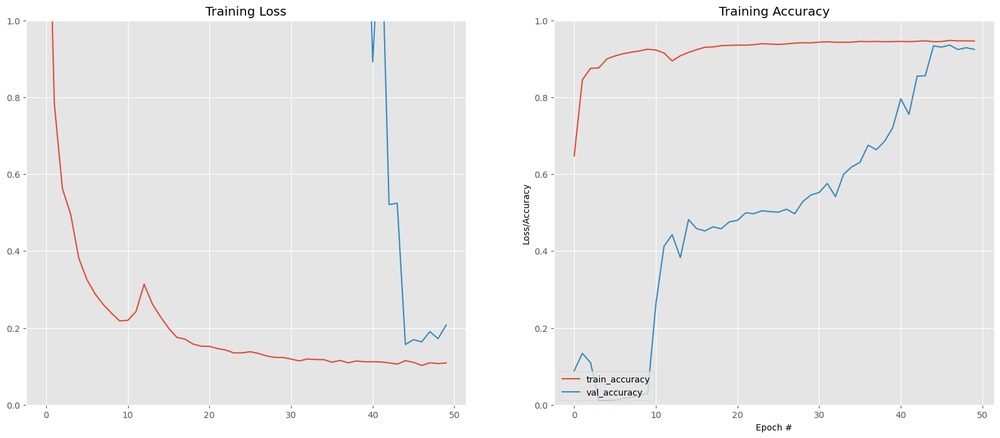

In [202]:
# Get actual number of epochs model was trained for
N = len(unet_result.history['loss'])

#Plot the model evaluation history
plt.style.use("ggplot")
fig = plt.figure(figsize=(20,8))

fig.add_subplot(1,2,1)
plt.title("Training Loss")
plt.plot(np.arange(0, N), unet_result.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), unet_result.history["val_loss"], label="val_loss")
plt.ylim(0, 1)

fig.add_subplot(1,2,2)
plt.title("Training Accuracy")
plt.plot(np.arange(0, N), unet_result.history["accuracy"], label="train_accuracy")
plt.plot(np.arange(0, N), unet_result.history["val_accuracy"], label="val_accuracy")
plt.ylim(0, 1)

plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()

### Extract and display model frame, prediction and mask batch

Found 18 images belonging to 1 classes.
Found 18 images belonging to 1 classes.
1/1 [==============================] - 1s 1s/step


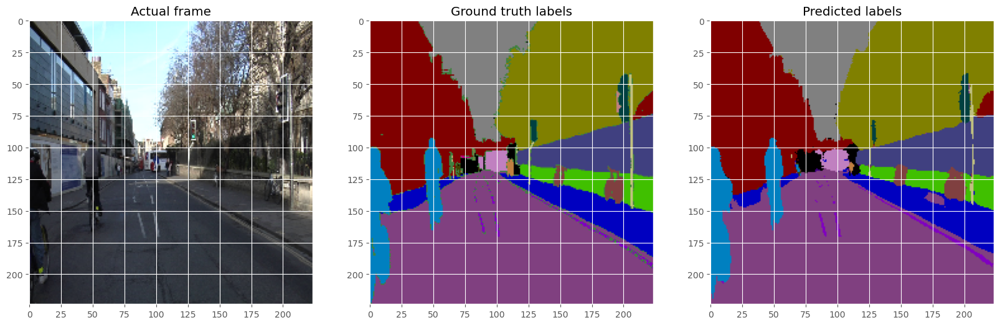

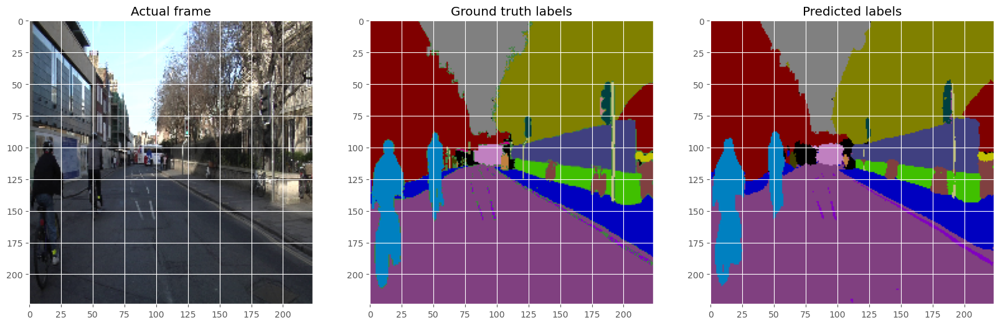

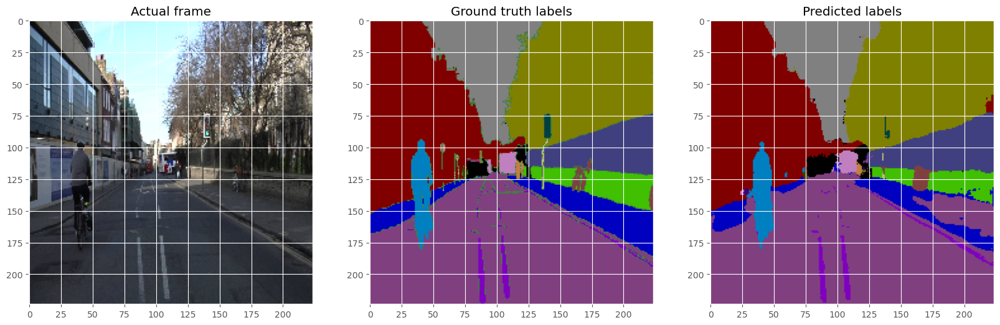

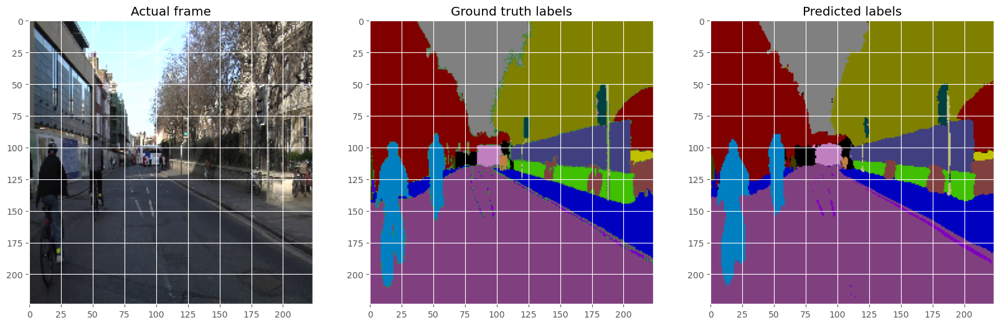

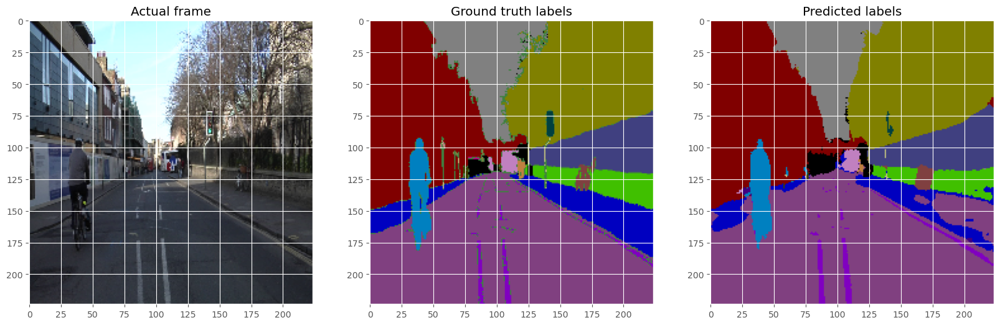

In [203]:
testing_gen = ValAugmentGenerator()

batch_img,batch_mask = next(testing_gen)
pred_all= model.predict(batch_img)
np.shape(pred_all)

for i in range(0,np.shape(pred_all)[0]):
    
    fig = plt.figure(figsize=(20,8))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[i])
    ax1.title.set_text('Actual frame')
#     ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(onehot_to_rgb(batch_mask[i],id2code))
#     ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(pred_all[i],id2code))
#     ax3.grid(b=None)
    
    plt.show()

In [206]:
# Evaluate the model on the testing data
test_loss, test_accuracy = model.evaluate(testing_gen)

# Print the results
print("UNet Test Loss:", test_loss)
print("UNet Test Accuracy:", test_accuracy)